# Advanced Lane Line Finding 

Importing Required Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import os

%matplotlib inline

Below function is used to load images from a given folder

In [2]:
#Function to load images from a folder
def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        img = mpimg.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

   # Below detecting corners and drawing them on all images in folder camera_cal

corners not detected for image number 7
corners not detected for image number 11
corners not detected for image number 15


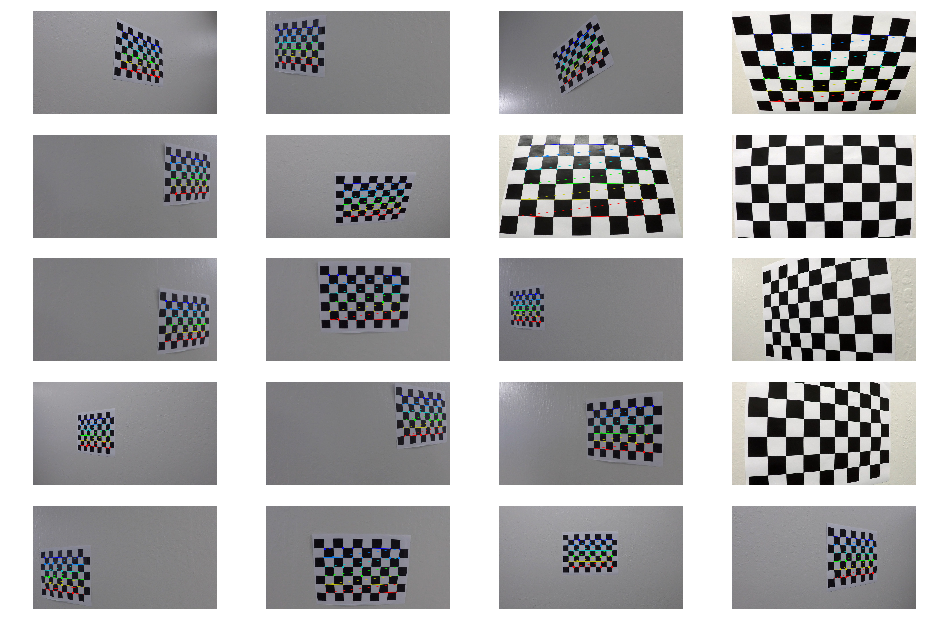

In [3]:
os.listdir("camera_cal/")

#Setting up figure properties to display
fig, axs = plt.subplots(5,4, figsize=(16, 11))
axs = axs.ravel()

#Loading Images from folder camera_cal into list images
images = load_images("camera_cal/")
obj_pts = []# 3D points from real world space
img_pts = []# 2D points from image plane

# After looking at the given chessboard images, chose number of corners along x and y directions as below
corners_x = 9
corners_y = 6
objp = np.zeros((corners_y*corners_x,3), np.float32)
objp[:,:2] = np.mgrid[0:corners_x,0:corners_y].T.reshape(-1,2) # x y coordinates

# for each image in camera_cal folder, detecting corners and drawing them on original image
for i,image_corners in enumerate(images):
    cv2.imwrite(os.path.join('chessboard_corner_images', 'original_image'+str(i)+'.jpg'), image_corners)
    gray = cv2.cvtColor(image_corners,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (corners_x,corners_y), None)   
    if ret == True:
        img_pts.append(corners)
        obj_pts.append(objp)
        image_corners = cv2.drawChessboardCorners(image_corners, (corners_x,corners_y), corners, ret)
    else:
        print('corners not detected for image number', i) 
    axs[i].axis('off')
    axs[i].imshow(image_corners)
    cv2.imwrite(os.path.join('chessboard_corner_images', 'corners_drawn'+str(i)+'.jpg'), image_corners)
    

Note: For few images above, desired number of corners (9,6) are not detected. 

   # Below I'm calibrating camera and undistorting images after camera is calibrated using camera matrix and distortion coefficient

In [4]:

# Function to Calibrate a camera, given an image snapped from that camera 
# This function returns dist-distortion coefficients, mtx- camera mcatrix
def calibrate_camera(img, obj_pts, img_pts):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pts, img_pts, gray.shape[::-1], None, None)   
    return ret, mtx, dist

# Calibrating Camera
ret, mtx, dist = calibrate_camera(images[4], obj_pts, img_pts)

# Function to undistort provided distorted image
def undistort_image(img, ret, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)


 # Undistorting  images 

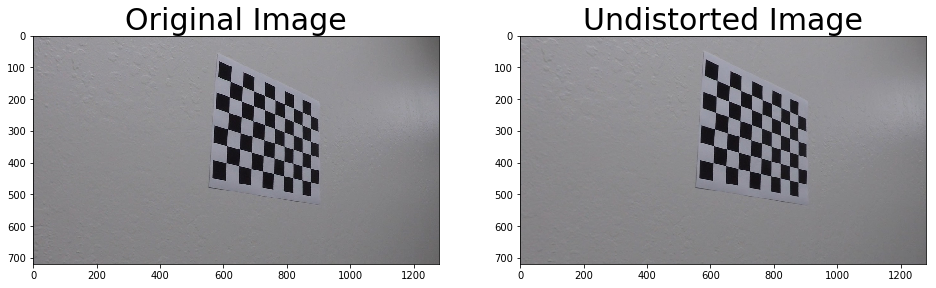

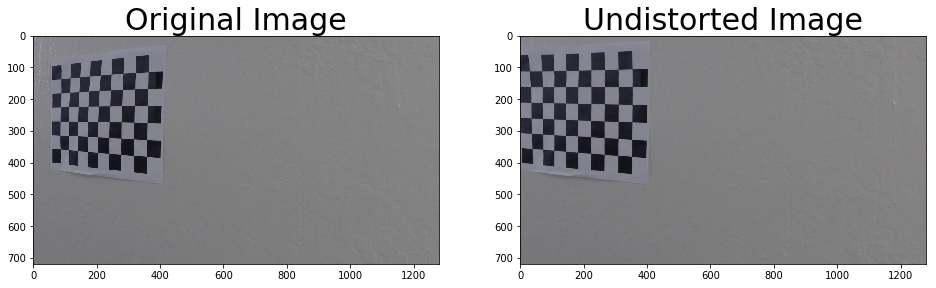

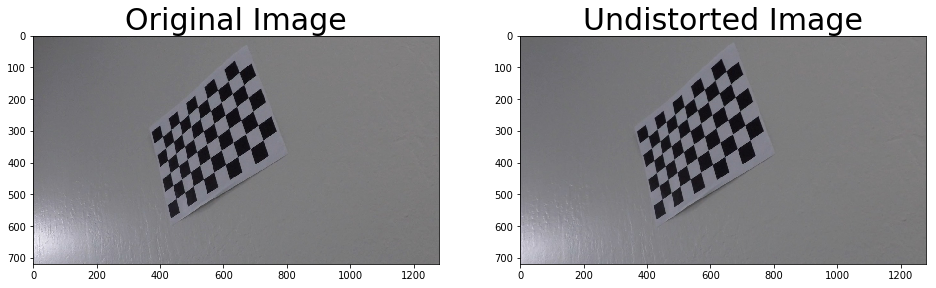

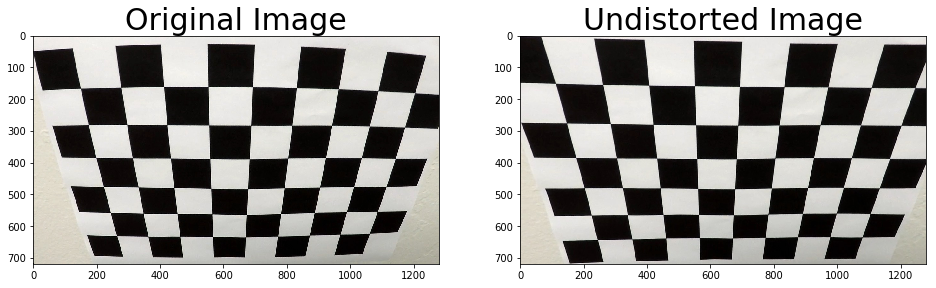

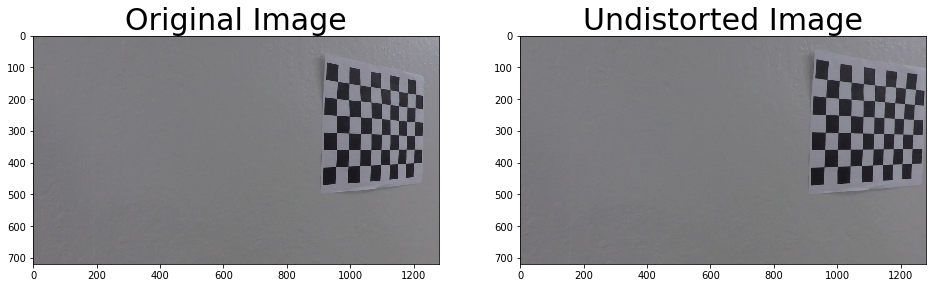

...

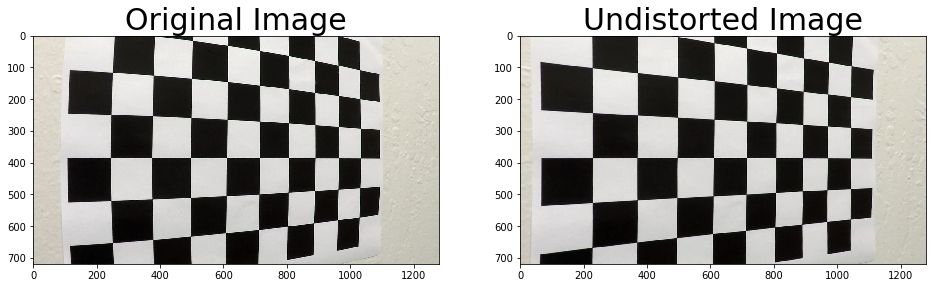

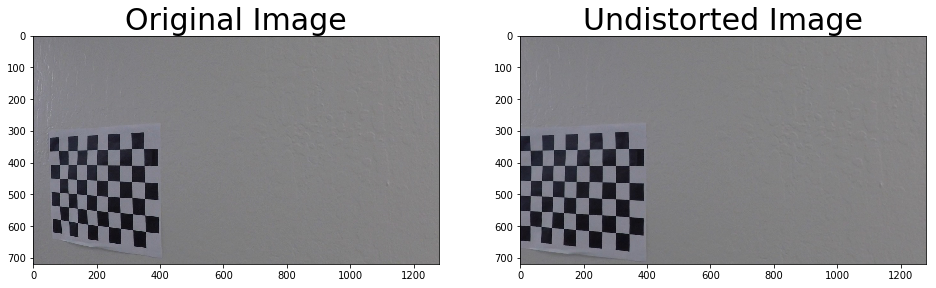

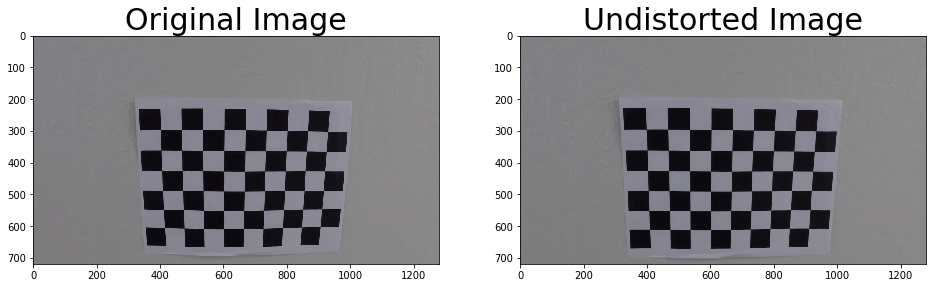

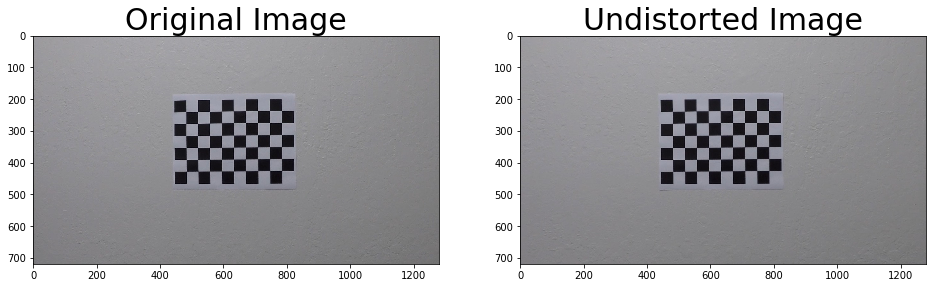

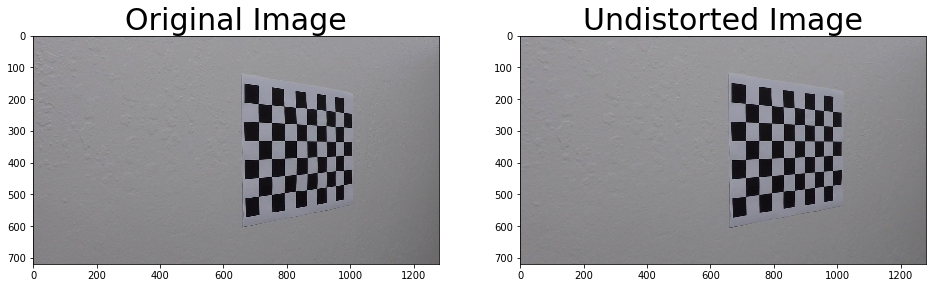

In [5]:
#Loading Images from folder test_images into list images
dist_images = load_images("camera_cal/")
# Undistorting each image using camera matrix and distortion coefficient
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(dist_img)
    cv2.imwrite(os.path.join('undist_calibrated_images', 'Original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))
    undist_img = undistort_image(dist_img, ret, mtx, dist)    
    ax2.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(undist_img)
    cv2.imwrite(os.path.join('undist_calibrated_images', 'undist_calibrated_image'+str(i)+'.jpg'), cv2.cvtColor(undist_img, cv2.COLOR_RGB2BGR))

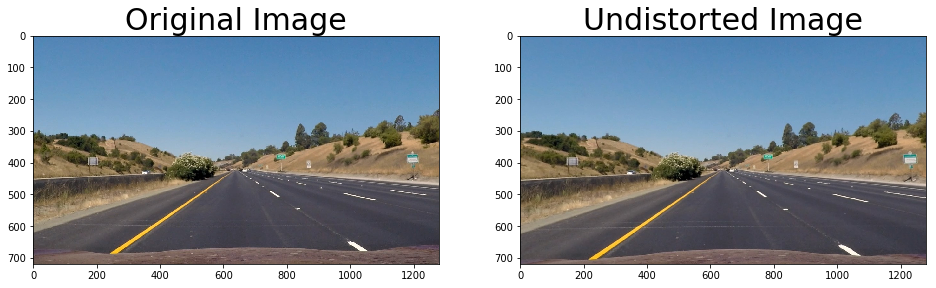

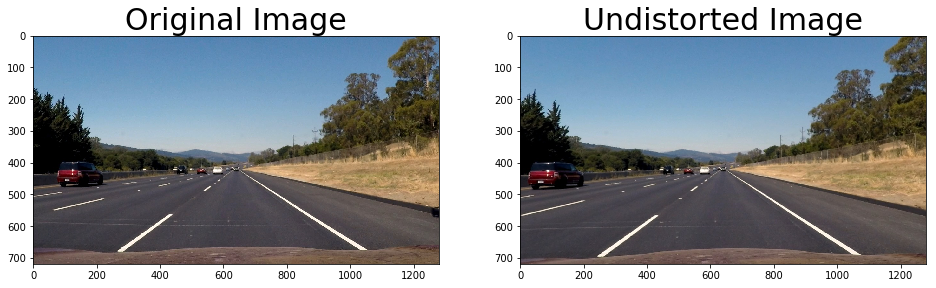

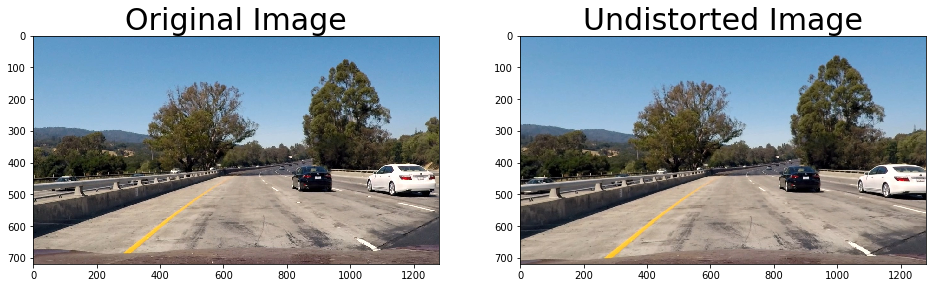

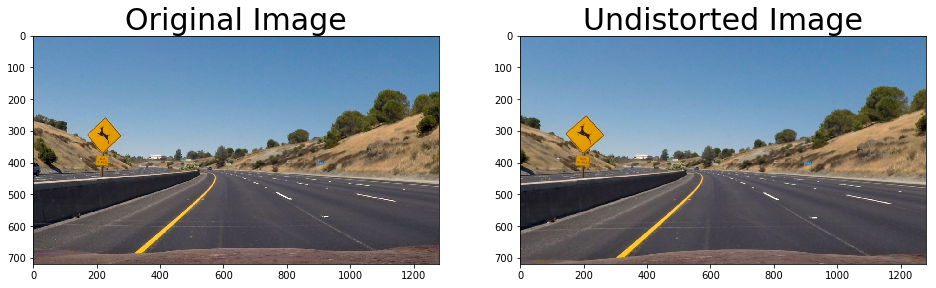

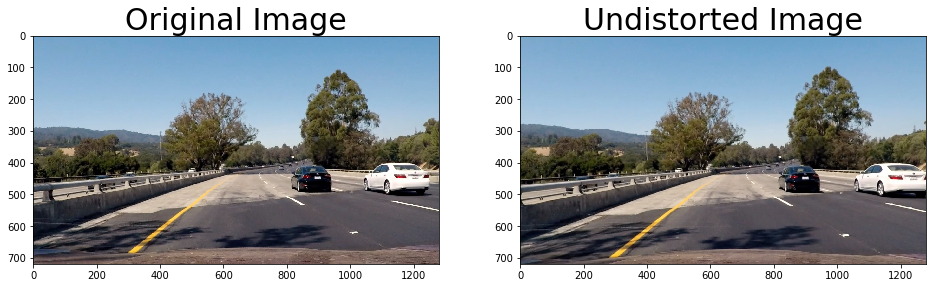

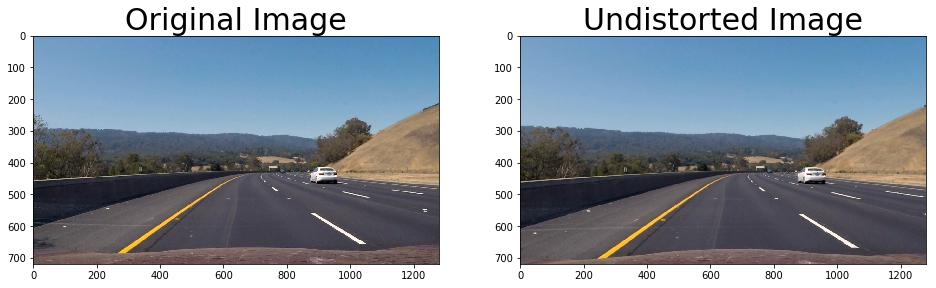

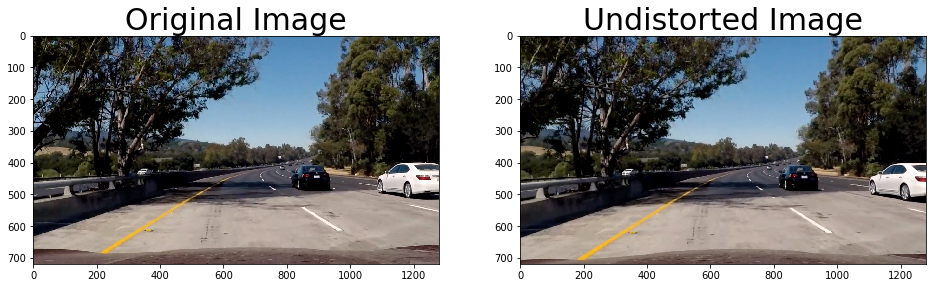

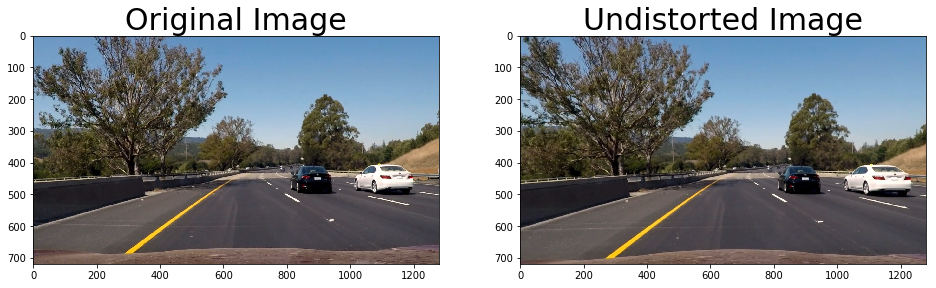

In [6]:
#Loading Images from folder test_images into list images to undistort them
dist_images = load_images("test_images/")
# Undistorting each image using camera matrix and distortion coefficient
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(dist_img)
    cv2.imwrite(os.path.join('undist_test_images', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))
    undist_img = undistort_image(dist_img, ret, mtx, dist)    
    ax2.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(undist_img)
    cv2.imwrite(os.path.join('undist_test_images', 'undist_image'+str(i)+'.jpg'), cv2.cvtColor(undist_img, cv2.COLOR_RGB2BGR))

After Undistorting image, applying perspective transform using src and dst points to get birds eye view.
Applying perspective transform before color and gradient thresholding becasue I think there is no need to do color and gradient thresholding on the whole image as we are only concerned to detect lane line pixels and compute radius of curvature from birds-eye-view image. I believe doing so will save computation time and space. 

By trial and error, I passed few images into function 'perspective_transform()' to obtain appropriate source and destination points using height and width of image. Below, you can see source (green) and destination (red) points displayed on an example image. I made use of width and height of image to chose robust source and destination points to obtain birds-eye-view image.


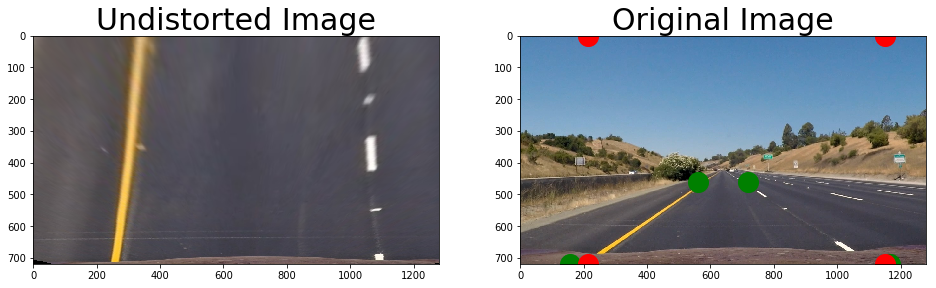

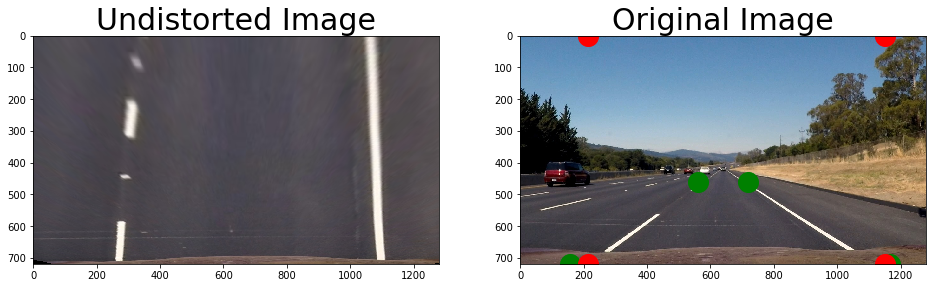

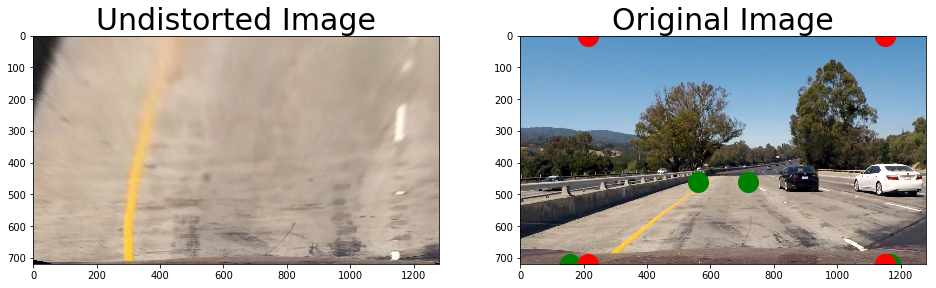

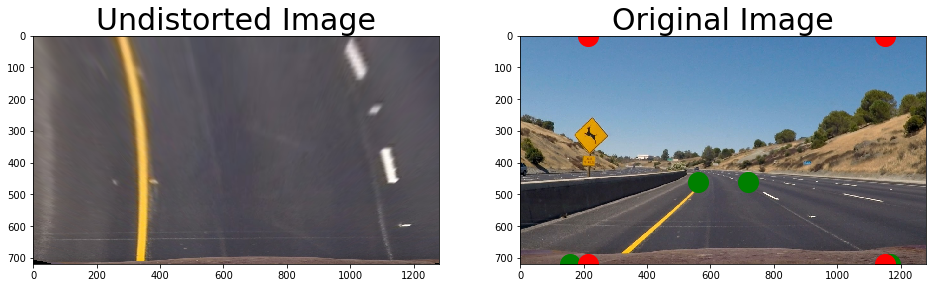

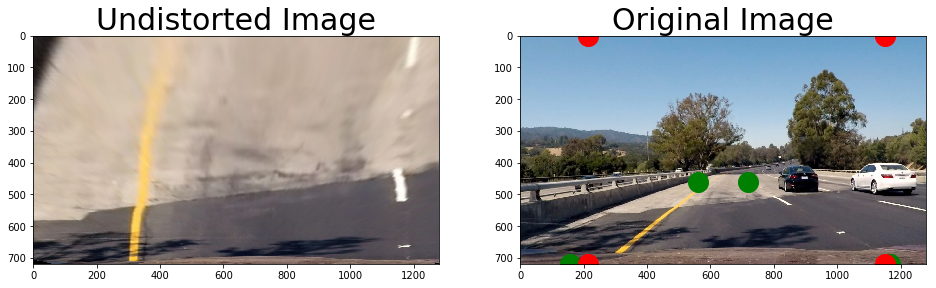

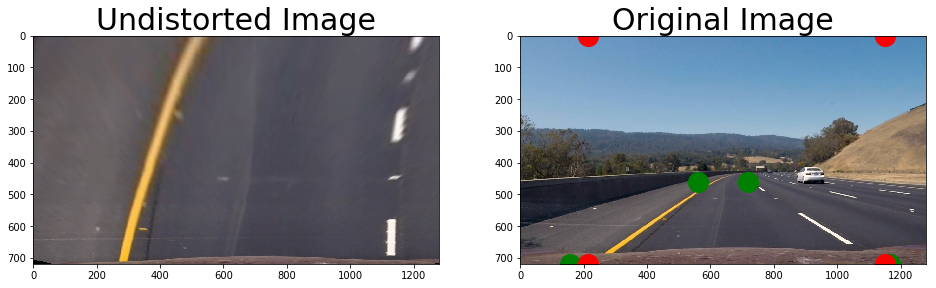

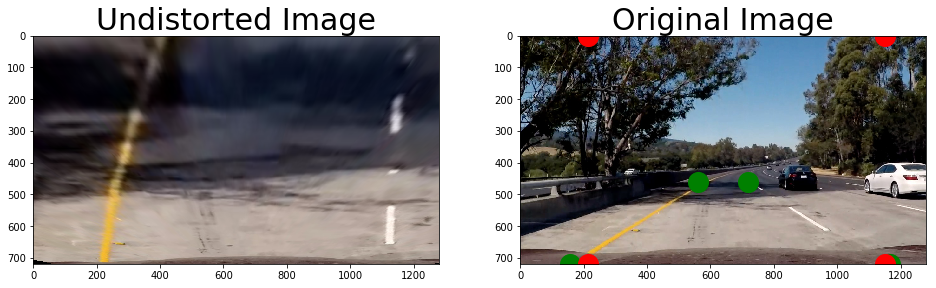

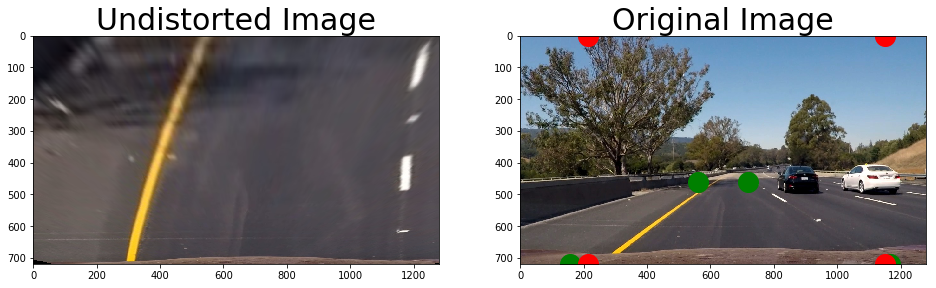

In [7]:

# Below function transforms given distorted image to desired perspective using src and dst points
def perspective_transform(img, ret, mtx, dist, src, dst):
    #Undistorting passed distorted image
    h, w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Using cv2.warpPerspective() to warp image to a top-down view          
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)    
    return warped, M, Minv
    

# Applying perspective transform to each image
for i,dist_img in enumerate(dist_images):
    
    # Source points
    #src=np.float32([[270,720],[580,480],[800,480],[1200,720]])
    # destination points. Chosen these to get birds eye view
    #dst=np.float32([[350,720],[350,0],[960,0],[960,720]])
     
    undist_img = undistort_image(dist_img, ret, mtx, dist) 
    h, w = undist_img.shape[:2]
    src = np.float32(
    [[(w / 2) - 80, h / 2 + 100],
    [(w*0.1)+30, h],
    [(w * 5 / 6) + 100, h],
    [(w / 2 + 80), h / 2 + 100]])
    dst = np.float32(
    [[(w / 6), 0],
    [(w / 6), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    for pt in src:
        plt.plot(*pt,'go',markersize=20)
    for pt in dst:
        plt.plot(*pt,'ro',markersize=20)
    ax2.set_title('Original Image', fontsize=30)
    ax2.imshow(dist_img)
    cv2.imwrite(os.path.join('perspective_transform_test_images', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))  
    ax1.set_title('Undistorted Image', fontsize=30)
    ax1.imshow(top_down_warped)
    cv2.imwrite(os.path.join('perspective_transform_test_images', 'birds_view_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  



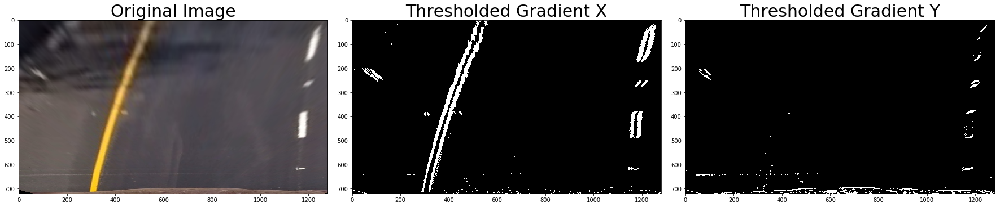

In [8]:

# Below Function does sobel gradient thresholding
def abs_sobel_thresh(img, thresh=(0,255), orient='x'):
    # Converting image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
       sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
       sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # Taking the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # Scaling to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Creating a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Returning this mask as binary image
    return sbinary

 
# Obtaining binary gradients along x and y for an image from test_images folder
grad_binary_x = abs_sobel_thresh(top_down_warped, thresh = (20, 250) , orient='x')
grad_binary_y = abs_sobel_thresh(top_down_warped, thresh = (20, 250) , orient='y')


# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary_x, cmap='gray')
ax2.set_title('Thresholded Gradient X', fontsize=30)
ax3.imshow(grad_binary_y, cmap='gray')
ax3.set_title('Thresholded Gradient Y', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


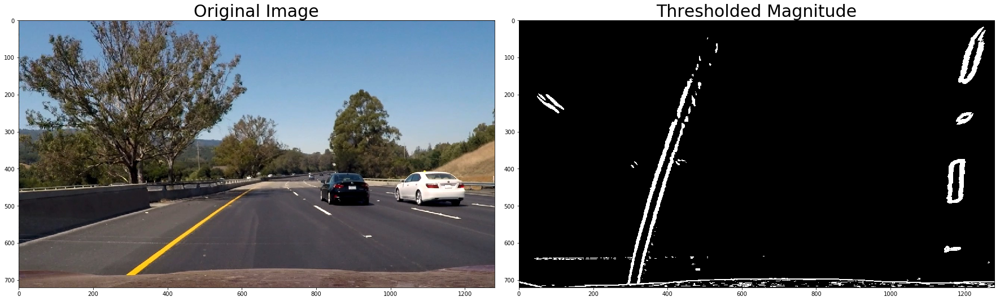

In [9]:
# Below Function computes magnitude of gradient 
def mag_thresh(img, sobel_kernel=3, mag_thresh=(180,255)):
    
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculating the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scaling to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    # Creating a binary mask where mag thresholds are met
    s_binary = np.zeros_like(scaled_sobel)
    s_binary[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1   
    return s_binary
    
# Obtaining binary image of magnitude of gradients along x and y directions for chosen thresholds    
mag_binary = mag_thresh(top_down_warped, sobel_kernel=5, mag_thresh=(20, 250))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dist_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


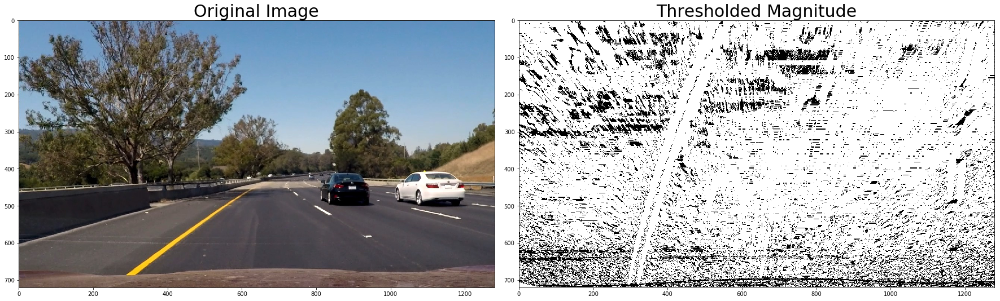

In [10]:
# # Below Function computes direction of gradient 
def dir_threshold(img, sobel_kernel=3, thresh=(0,np.pi/2)):
    
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel )
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Taking the absolute value of the x and y gradients
    # Using np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Returning this mask as binary_output image
    return binary_output
    
# Running the function for chosen threshold values
dir_binary = dir_threshold(top_down_warped, sobel_kernel=3, thresh=(0, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dist_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)




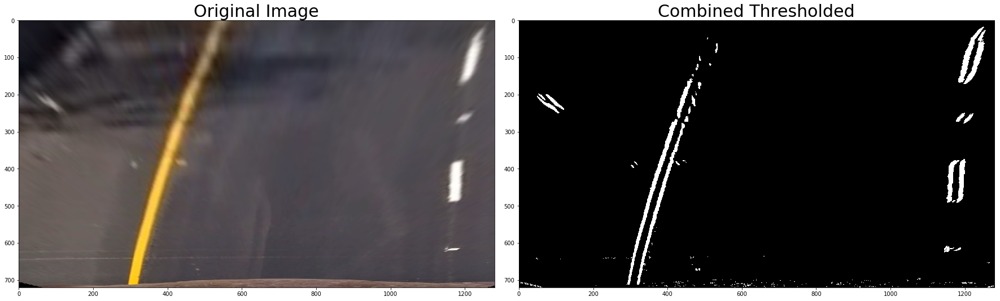

In [11]:
 # Below function computes magnitude and direction of gradients along x and y direction 
 # and applies thresholding for chosen threshold values
def gradient_threshold(img, thresh_sx= (20, 200), thresh_sy= (10, 60), 
                       thresh_mag= (20, 150), thresh_dir= (0, np.pi/2), ksize=3):
    
    gradx = abs_sobel_thresh(img, thresh_sx, orient='x',)
    grady = abs_sobel_thresh(img, thresh_sy, orient='y',)
    #print(ksize)
    mag_binary = mag_thresh(img, ksize, thresh_mag)
    dir_binary = dir_threshold(img, ksize, thresh_dir)

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

# Running the function
combined = gradient_threshold(top_down_warped, thresh_sx= (20, 250), thresh_sy= (20, 250), 
                       thresh_mag= (20, 250), thresh_dir= (0, 1.3), ksize = 5)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Thresholded', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

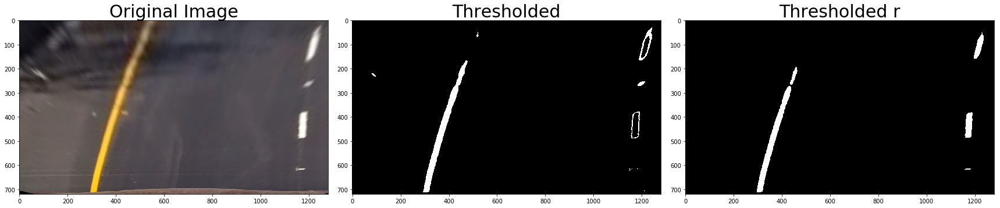

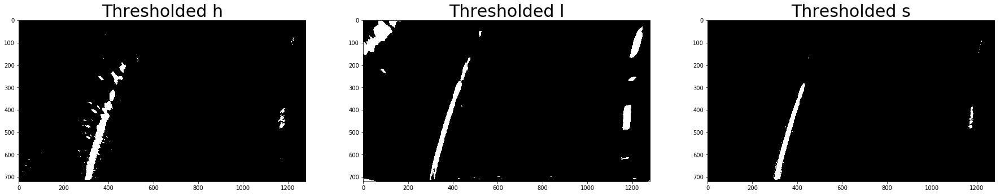

In [12]:
# Below function does RGB and HLS color tranform and applies thresholding for chosen threshold values 

def color_threshold(img, thresh, thresh_r, thresh_h, thresh_l, thresh_s ):
    
    binary_thresh = np.copy(img) # placeholder line
    binary_r = np.copy(img) # placeholder line
    binary_h = np.copy(img) # placeholder line
    binary_l = np.copy(img) # placeholder line
    binary_s = np.copy(img) # placeholder line
    
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    # r Channel Thresholding
    binary_r = np.zeros_like(r)
    binary_r[(r >= thresh_r[0]) & (r <= thresh_r[1])] = 1
    #plt.imshow(binary_R)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary_thresh = np.zeros_like(gray)
    binary_thresh[(gray >= thresh[0]) & (gray <= thresh[1])] = 1
    #plt.imshow(binary_thresh)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    l = hls[:,:,1]
    s = hls[:,:,2]
    binary_h = np.zeros_like(h)
    binary_h[(h >= thresh_h[0]) & (h <= thresh_h[1])] = 1
    binary_l = np.ones_like(l)
    binary_l[(l >= thresh_l[0]) & (l <= thresh_l[1])] = 0
    binary_s = np.zeros_like(s)
    binary_s[(s >= thresh_s[0]) & (s <= thresh_s[1])] = 1
    

    return  binary_thresh, binary_r, binary_h, binary_l, binary_s

# Running the function for chosen threshold values
binary_thresh, binary_r, binary_h, binary_l, binary_s = color_threshold(top_down_warped, 
                                                                        thresh= (150, 220), thresh_r= (200, 255), 
                                                                        thresh_h= (20, 100), thresh_l= (25, 140), 
                                                                        thresh_s= (170, 255))

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_thresh, cmap='gray')
ax2.set_title('Thresholded', fontsize=30)
ax3.imshow(binary_r, cmap='gray')
ax3.set_title('Thresholded r', fontsize=30)

f2, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
ax1.imshow(binary_h, cmap='gray')
ax1.set_title('Thresholded h', fontsize=30)
ax2.imshow(binary_l, cmap='gray')
ax2.set_title('Thresholded l', fontsize=30)
ax3.imshow(binary_s, cmap='gray')
ax3.set_title('Thresholded s', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)






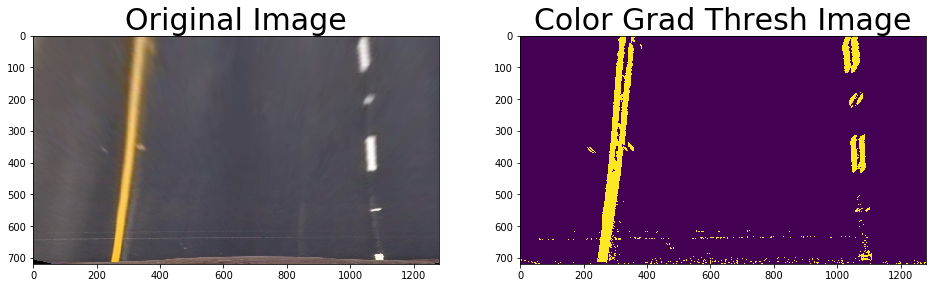

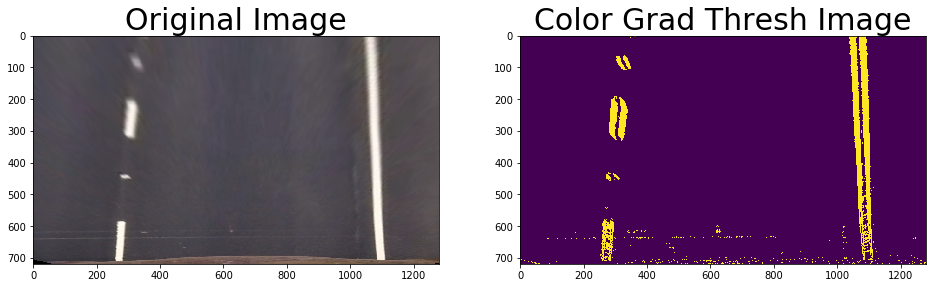

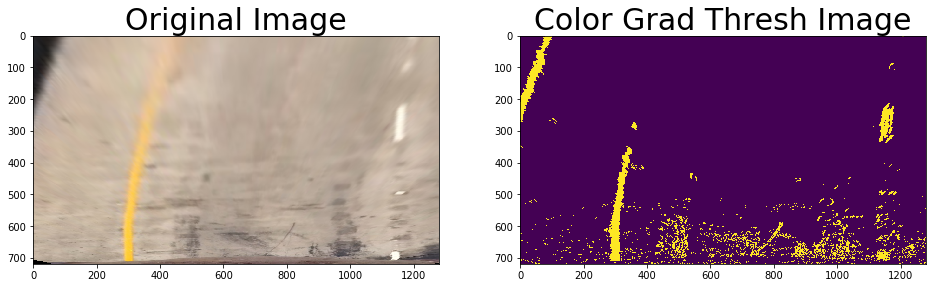

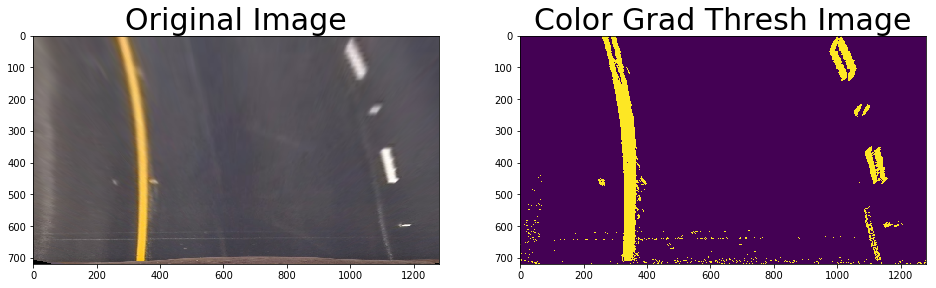

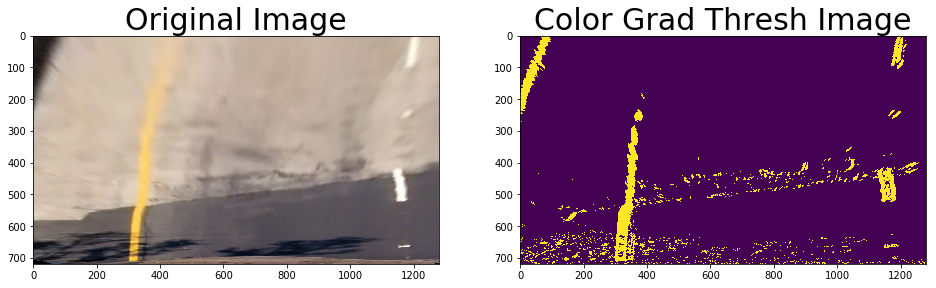

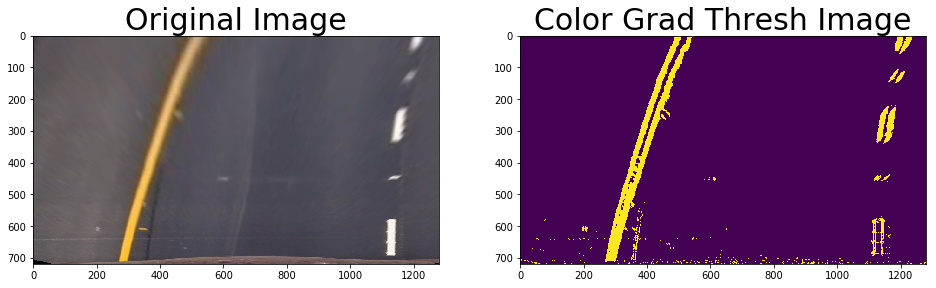

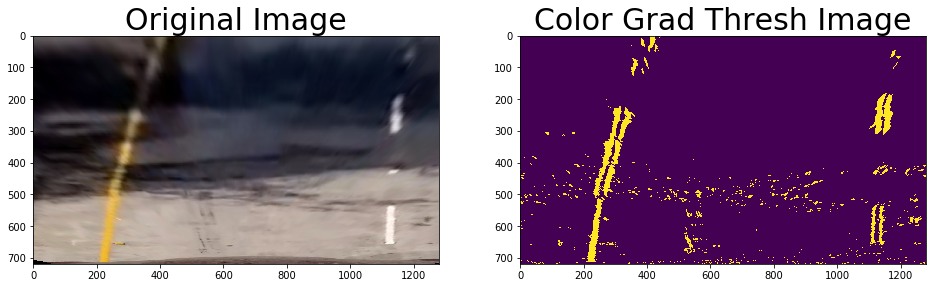

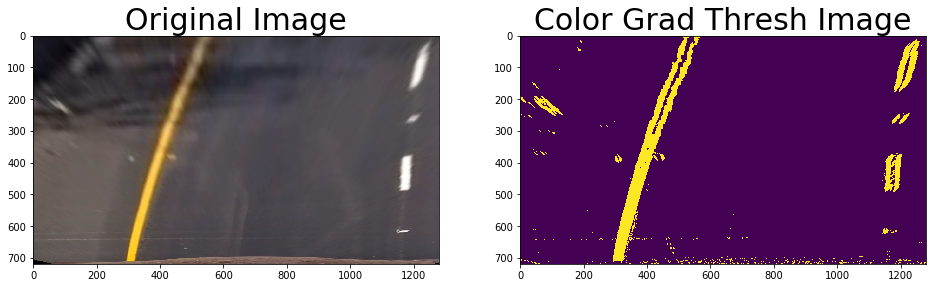

In [13]:
# Below function applies both color and gradient thresholding on an image for chosen threshold values
def color_gradient_threshold(img, thresh = (180, 255), thresh_r = (170, 255),thresh_h = (0, 100), 
                             thresh_s=(170, 255),thresh_l = (25, 140), 
                             thresh_sx=(20, 160), thresh_sy=(20, 100), thresh_mag=(10,100), 
                             thresh_dir=(0.7,1.3), ksize=3):
    img = np.copy(img)
    
    gradient = gradient_threshold(img, thresh_sx, thresh_sy, thresh_mag, thresh_dir, ksize)
    binary_thresh, binary_r, binary_h, binary_l, binary_s = color_threshold(top_down_warped, thresh, thresh_r, 
                                                                            thresh_h, thresh_l, thresh_s)
    
    color = np.zeros_like(binary_r)
    color[ ((binary_s == 1 ) & (binary_h == 1)  ) ] = 1
    # Stack each channel
    #out = np.dstack(( np.zeros_like(gradient), gradient, color))
    out = np.zeros_like(color)
    out[(gradient == 1) | (color == 1)] = 255
    return out

# Running the function
result = color_gradient_threshold(top_down_warped, thresh= (50, 255), thresh_r= (200, 255), 
                                                   thresh_h= (20, 100), thresh_l= (25, 140), 
                                                   thresh_s= (170, 255), 
                                                   thresh_sx= (20, 250), thresh_sy= (20, 250), 
                                                   thresh_mag= (20, 250), thresh_dir= (0, 1.3),
                                                   ksize = 5 )

# applying color and gradient thresholding for each test image for a chosen threshold values
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    #ax1[i].axis('off')
    
    undist_img = undistort_image(dist_img, ret, mtx, dist)
    h, w = undist_img.shape[:2]
    src = np.float32(
    [[(w / 2) - 80, h / 2 + 100],
    [(w*0.1)+30, h],
    [(w * 5 / 6) + 100, h],
    [(w / 2 + 80), h / 2 + 100]])
    dst = np.float32(
    [[(w / 6), 0],
    [(w / 6), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(top_down_warped)
    cv2.imwrite(os.path.join('color_threshold_images', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    result = color_gradient_threshold(top_down_warped, thresh= (70, 200), thresh_r= (200, 255), 
                                                   thresh_h= (20, 100), thresh_l= (25, 140), 
                                                   thresh_s= (170, 255), 
                                                   thresh_sx= (20, 250), thresh_sy= (10, 200), 
                                                   thresh_mag= (10, 100), thresh_dir= (0, 1.3),
                                                   ksize = 5 )
    
    ax2.set_title('Color Grad Thresh Image', fontsize=30)
    ax2.imshow(result)
    cv2.imwrite(os.path.join('color_threshold_images', 'color_threshold_image'+str(i)+'.jpg'), result)  


    


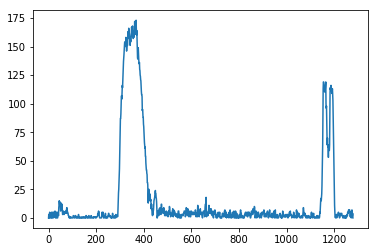

In [14]:
# Below function computes histogram for a given image
def hist(img):
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half =  img[img.shape[0]//2:,:]

    # the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    return histogram

# Creating histogram of image binary activations
histogram = hist(result/255)

# Visualize the resulting histogram
plt.plot(histogram)



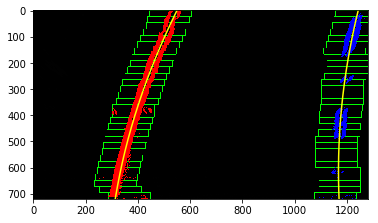

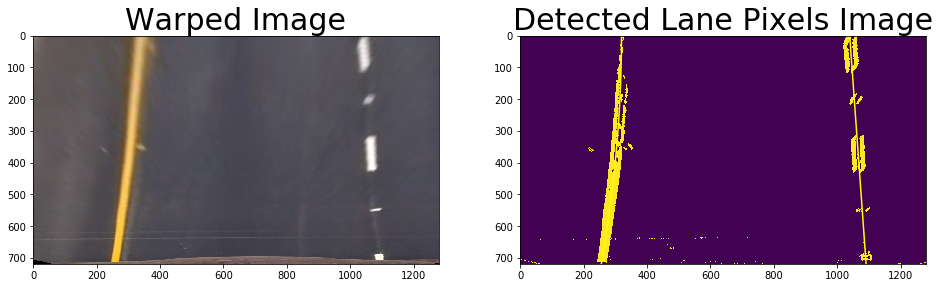

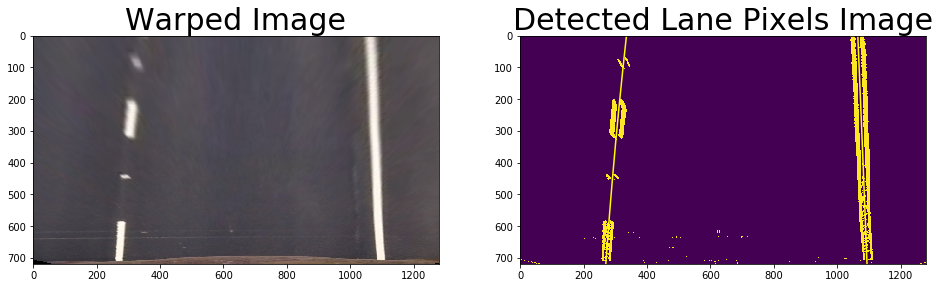

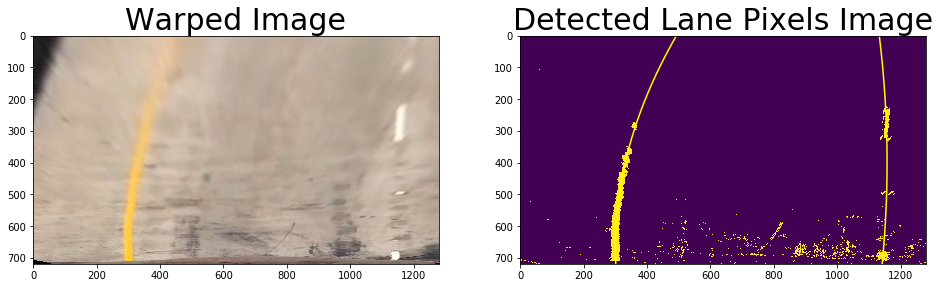

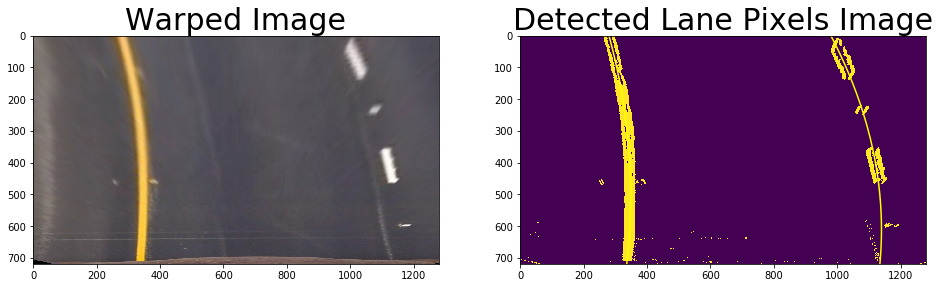

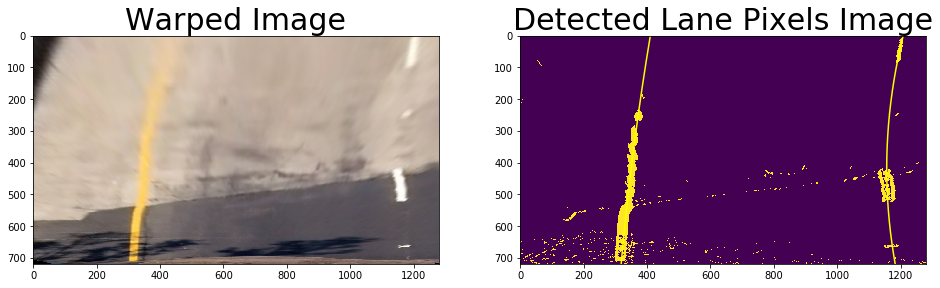

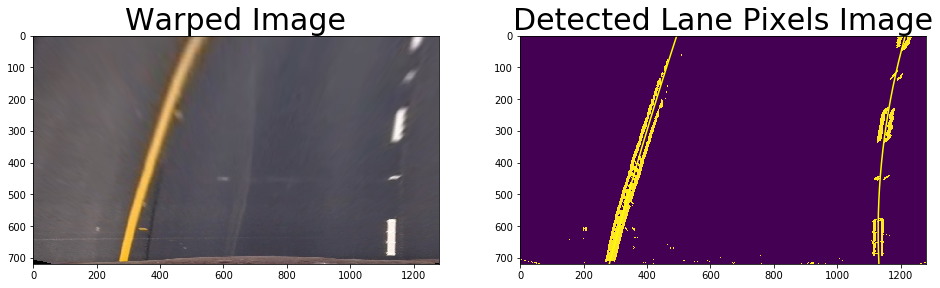

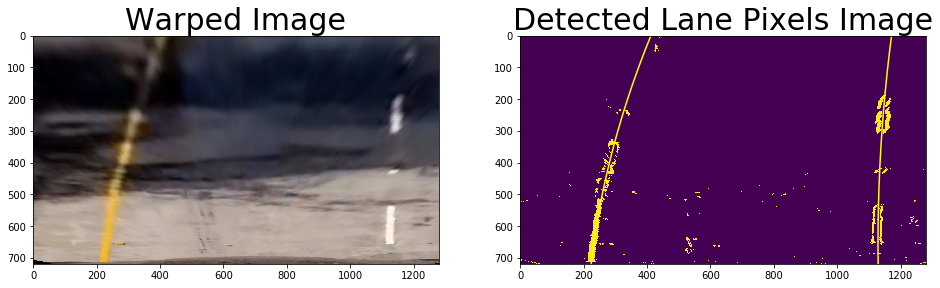

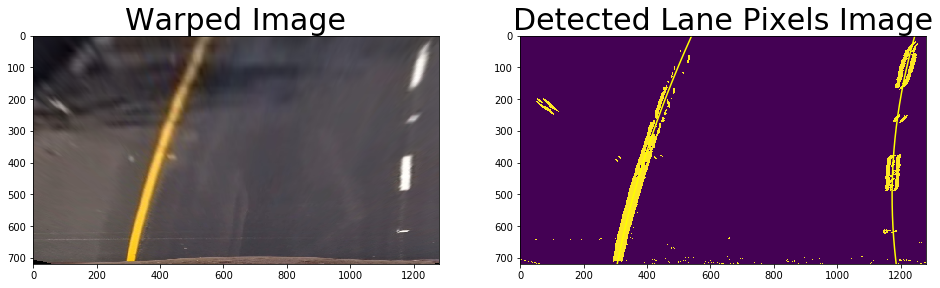

In [15]:

# Below function obtains pixels of left and right lane using sliding window approach
def find_lane_pixels(binary_warped):
    # Taking histogram of the bottom half of the image
    histogram = hist(binary_warped)#np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Creating an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Finding the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #plt.imshow(binary_warped)
    # HYPERPARAMETERS
    # Number of sliding windows
    nwindows = 30
    # Setting the width of the windows +/- margin
    margin = 80
    # Setting minimum number of pixels found to recenter window
    minpix = 30
    
    # Setting height of windows - based on nwindows above an image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identifying the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Creating empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Stepping through the windows one by one
    for window in range(nwindows):
        # Identifying window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Finding the four below boundaries of the window ###
        #print(binary_warped.shape[0])
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Drawing the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### Identifying the nonzero pixels in x and y within the window ###
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox <= win_xright_high)).nonzero()[0]
        
        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        pass 

    # Concatenating the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    ### Fitting a second order polynomial to each using `np.polyfit` ###
    # Fitting a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generating x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')   
    return out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty


# running the fnction
out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(result)
ploty = np.linspace(0, result.shape[0]-1, result.shape[0] )
#Plot the polynomial lines onto the image
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(out_img)
cv2.imwrite(os.path.join('detected_lane_pixels_images', 'sliding_window_image.jpg'), out_img)  



# Finding lane pixels in each test image and visualizing sliding windows
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    undist_img = undistort_image(dist_img, ret, mtx, dist)
    h, w = undist_img.shape[:2]
    # source points
    src=np.float32([[300,700],[550,500],[700,500],[1100,700]])
    # destination points. Chosen these to get birds eye view
    dst=np.float32([[350,700],[300,0],[800,0],[1100,700]])
    src = np.float32(
    [[(w / 2) - 80, h / 2 + 100],
    [(w*0.1)+30, h],
    [(w * 5 / 6) + 100, h],
    [(w / 2 + 80), h / 2 + 100]])
    dst = np.float32(
    [[(w / 6), 0],
    [(w / 6), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    ax1.set_title('Warped Image', fontsize=30)
    ax1.imshow(top_down_warped)
    cv2.imwrite(os.path.join('detected_lane_pixels_images', 'warped_original_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  
    
    result = color_gradient_threshold(top_down_warped, thresh= (70, 200), thresh_r= (200, 255), 
                                                   thresh_h= (20, 100), thresh_l= (25, 140), 
                                                   thresh_s= (170, 255), 
                                                   thresh_sx= (20, 250), thresh_sy= (20, 250), 
                                                   thresh_mag= (20, 250), thresh_dir= (0, 1.3),
                                                   ksize = 5 )
    
    out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(result)
    ploty = np.linspace(0, result.shape[0]-1, result.shape[0] )
    #Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.imshow(out_img)
    ax2.set_title('Detected Lane Pixels Image', fontsize=30)
    ax2.imshow(result)
    cv2.imwrite(os.path.join('detected_lane_pixels_images', 'detected_lane_pixels_image'+str(i)+'.jpg'), result)  


    
    

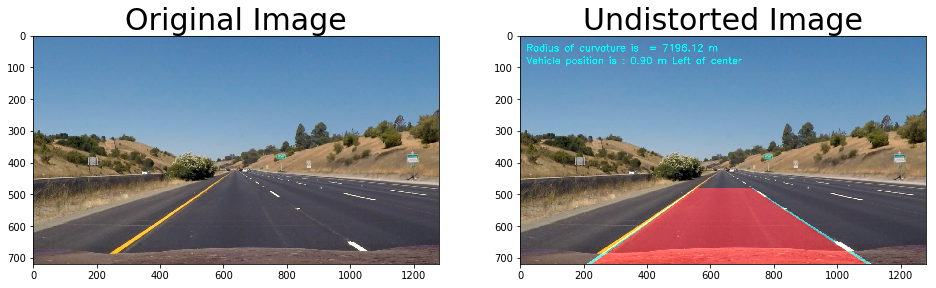

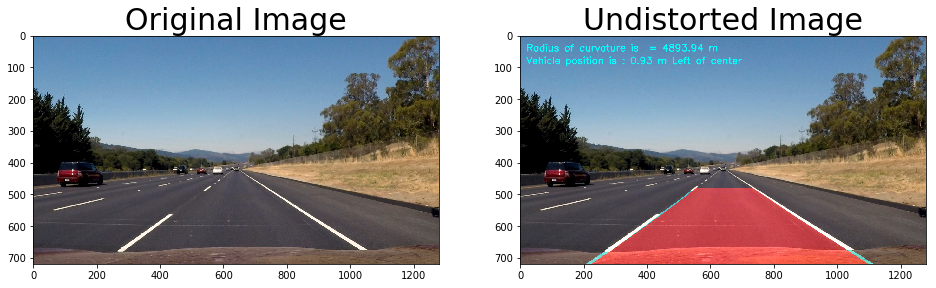

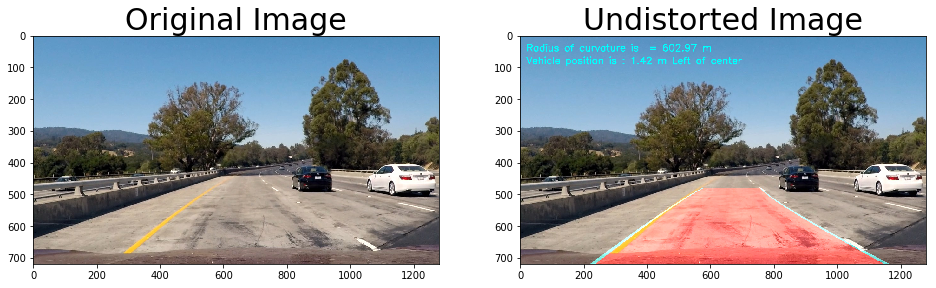

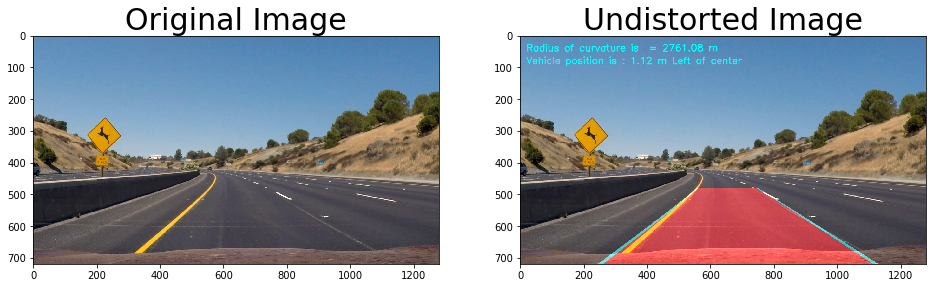

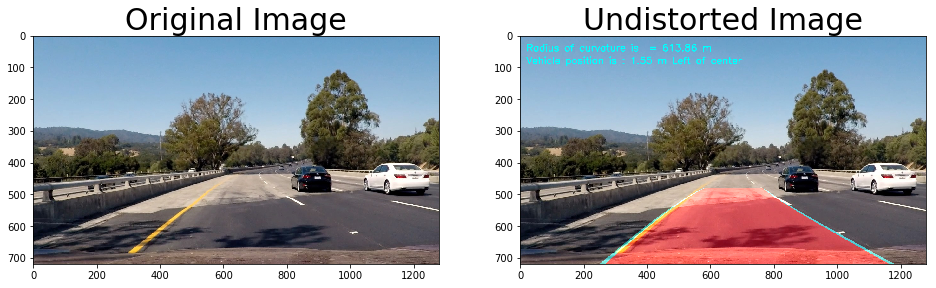

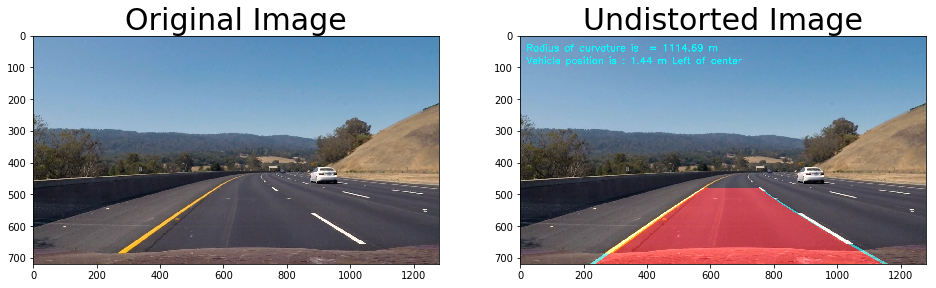

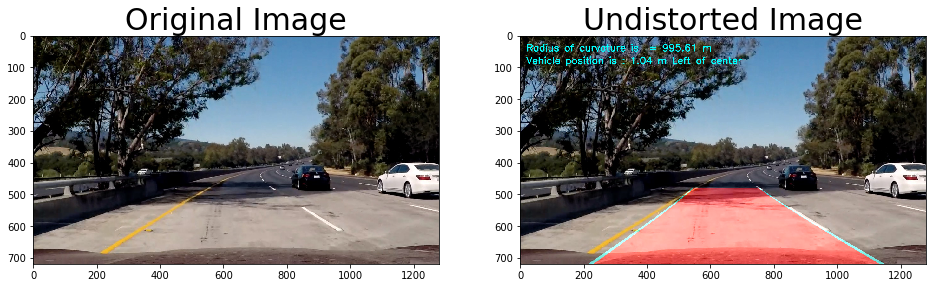

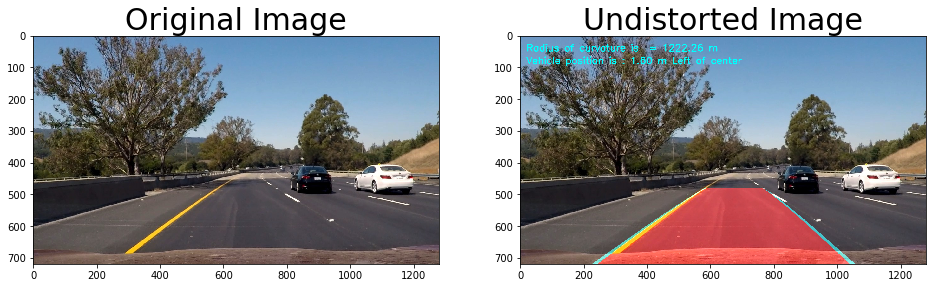

In [22]:
# Below is the pipeline that undistorts an image, then applies perspective transform to get birds eye view,
# then applies color and gradient thresholding to get a binary image, which is used to compute the histograms 
# and then to find lane pixels using sliding window approach

def advanced_lanes_pipeline(orig_image):
    
    # undistorting and perspective transforming image
    undist_img = undistort_image(orig_image, ret, mtx, dist)
    h,w = undist_img.shape[:2]
    #print(img_size)
    # Source points
    #src=np.float32([[270,720],[580,480],[800,480],[1200,720]])
    # destination points. Chosen these to get birds eye view
    #dst=np.float32([[350,720],[350,0],[960,0],[960,720]])

    src = np.float32(
    [[(w / 2) - 80, h / 2 + 100],
    [(w*0.1)+30, h],
    [(w * 5 / 6) + 100, h],
    [(w / 2 + 80), h / 2 + 100]])
    dst = np.float32(
    [[(w / 6), 0],
    [(w / 6), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    
    
    src = np.float32(
    [[(w*0.5) - 140, h / 2 + 120],
    [(w*0.1)+50, h],
    [(w*0.8) + 50, h],
    [(w*0.5 + 90), h / 2 + 120]])
    dst = np.float32(
    [[(w / 5), 0],
    [(w / 5), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    
    
    
    #Applying Perspective Transform to save time and space complexities
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    # Applying color transform and gradient thresholding
    color_grad_binary = color_gradient_threshold(top_down_warped, thresh= (70, 200), thresh_r= (200, 255), 
                                                   thresh_h= (20, 100), thresh_l= (25, 140), 
                                                   thresh_s= (170, 255), 
                                                   thresh_sx= (20, 250), thresh_sy= (20, 250), 
                                                   thresh_mag= (20, 250), thresh_dir= (0, 1.3),
                                                   ksize = 5 )
    
    out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(color_grad_binary)
    
    new_img = np.copy(orig_image)
    warp_zero = np.zeros_like(color_grad_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    h,w = color_grad_binary.shape
    ploty = np.linspace(0, h-1, num=h)
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (255,0, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,255,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h), flags=cv2.INTER_LINEAR) 
    output = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
     
  
    # Curvature Computation
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    y_eval = np.max(ploty)
    # Fitting a second order polynomial to pixel positions in each fake lane line
    ##### Fittingnew polynomials to x,y in world space #####
    ##### Utilizing `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
    left_curverad = 0.5*((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(left_fit_cr[0])
    right_curverad = 0.5*((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(right_fit_cr[0])
    #avg_curve = np.mean([left_curverad, right_curverad])
    camera_center = 0.5*(left_fitx[0] + right_fitx[0])
    offset = (camera_center - undist_img.shape[1]/2)*xm_per_pix
    # We have radii of curvatures for left and right lanes. These two might be different. 
    # So, averaging both radii and displaying
    avg_curvature = np.mean([left_curverad, right_curverad])
    font=cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(output,'Radius of curvature is  = %.2f m'%(avg_curvature),(20,50), font, 1,(0,255,255),2,cv2.LINE_AA)
       
    if offset>0:
        text='Left'
    else:
        text='Right'
    cv2.putText(output,'Vehicle position is : %.2f m %s of center'%(abs(offset), text),(20,90),
                        font, 1,(0,255,255),2,cv2.LINE_AA)      
    return output


# Running each test image through pipeline
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(dist_img)
    cv2.imwrite(os.path.join('pipeline_images', 'pipeline_original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))  
    out_img = advanced_lanes_pipeline(dist_img)
    ax2.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(out_img)
    cv2.imwrite(os.path.join('pipeline_images', 'pipeline_image'+str(i)+'.jpg'), cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))  
    
    

Below running the test video through pipeline

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [18]:
def process_image(image):

    return advanced_lanes_pipeline(image)

In [20]:
output_file = 'test_videos/project_video_output.mp4'
project_video_output = 'project_video.mp4'

clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image)
%time project_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video test_videos/project_video_output2.mp4
[MoviePy] Writing video test_videos/project_video_output2.mp4


100%|█████████▉| 1260/1261 [11:48<00:00,  1.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos/project_video_output2.mp4 

CPU times: user 9min 36s, sys: 3.23 s, total: 9min 39s
Wall time: 11min 51s


In [21]:
output_file = 'test_videos/challenge_video_output.mp4'
challenge_video_output = 'challenge_video.mp4'

clip2 = VideoFileClip("challenge_video.mp4")
project_clip = clip2.fl_image(process_image)
%time project_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video test_videos/challenge_video_output2.mp4
[MoviePy] Writing video test_videos/challenge_video_output2.mp4


100%|██████████| 485/485 [04:26<00:00,  1.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos/challenge_video_output2.mp4 

CPU times: user 3min 38s, sys: 1.24 s, total: 3min 39s
Wall time: 4min 29s


In [149]:
output_file = 'test_videos/harder_challenge_video_output.mp4'
harder_challenge_video_output = 'harder_challenge_video.mp4'

clip3 = VideoFileClip("harder_challenge_video.mp4")
project_clip = clip3.fl_image(process_image)
%time project_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video test_videos/harder_challenge_video_output.mp4
[MoviePy] Writing video test_videos/harder_challenge_video_output.mp4



 25%|██▌       | 303/1200 [03:15<10:40,  1.40it/s]


 50%|█████     | 605/1200 [06:34<07:04,  1.40it/s]


 76%|███████▌  | 907/1200 [09:51<03:03,  1.60it/s]


100%|█████████▉| 1199/1200 [12:53<00:00,  1.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos/harder_challenge_video_output.mp4 

CPU times: user 10min 14s, sys: 2.5 s, total: 10min 17s
Wall time: 12min 57s


640
610.83117558
Radius of Curvature of left and right lanes are 683.483197806 538.179153354
camera center is 3.23946721049


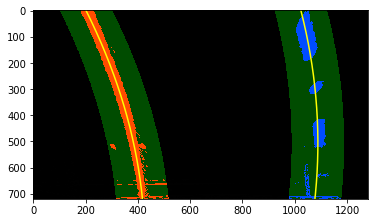

In [108]:

  
leftx, lefty, rightx, righty, out_img = find_lane_pixels(result)

left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Grab activated pixels
nonzero = result.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100

    
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

left_fit_new, right_fit_new = (None, None)
if len(leftx) != 0:
        # Fit a second order polynomial to each
    left_fit_new = np.polyfit(lefty, leftx, 2)
if len(rightx) != 0:
    right_fit_new = np.polyfit(righty, rightx, 2)

ploty = np.linspace(0, result.shape[0]-1, result.shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]        
left_fitx_new = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
right_fitx_new = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]       
 
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((result, result, result))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()

left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
output = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
plt.imshow(output)



# Curvature Computation
ym_per_pix = 30/720
xm_per_pix = 3.7/700
y_eval = np.max(ploty)
# Fit a second order polynomial to pixel positions in each fake lane line
    ##### TO-DO: Fit new polynomials to x,y in world space #####
    ##### Utilize `ym_per_pix` & `xm_per_pix` here #####
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
left_curverad = 0.5*((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(left_fit_cr[0])
right_curverad = 0.5*((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(right_fit_cr[0])
#avg_curve = np.mean([left_curverad, right_curverad])
camera_center = 0.5*(left_fitx[0] + right_fitx[0])

print('Radius of Curvature of left and right lanes are', left_curverad, right_curverad)
print('camera center is', camera_center*xm_per_pix)
#out_img = find_lane_pixels_2(result)
#plt.imshow(out_img)

In [ ]:

def curve_fit_lane_pixels(result)
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(result)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Grab activated pixels
    nonzero = result.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100

    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, result.shape[0]-1, result.shape[0])
        ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]        
    left_fitx_new = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
    right_fitx_new = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]       
 
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((result, result, result))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()

    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    output = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    plt.imshow(output)



    # Curvature Computation
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    y_eval = np.max(ploty)
    # Fit a second order polynomial to pixel positions in each fake lane line
    ##### TO-DO: Fit new polynomials to x,y in world space #####
    ##### Utilize `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
    left_curverad = 0.5*((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(left_fit_cr[0])
    right_curverad = 0.5*((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(right_fit_cr[0])
    #avg_curve = np.mean([left_curverad, right_curverad])
    camera_center = 0.5*(left_fitx[0] + right_fitx[0])

    print('Radius of Curvature of left and right lanes are', left_curverad, right_curverad)
    print('camera center is', camera_center*xm_per_pix)
    



In [ ]:
def draw_curve_lanes_pipeline(image)

    # undistorting and perspective transforming image
    undist_img = undistort_image(image, ret, mtx, dist)
    #Applying Perspective Transform to save time and space complexities
    top_down_warped, perspective_M = perspective_transform(undist_img, ret, mtx, dist)
    # Applying color transform and gradient thresholding
    color_grad_binary = color_gradient_threshold(top_down_warped, thresh= (180, 255), thresh_r= (170, 255), 
                                                   thresh_h= (0, 100), thresh_l= (25, 140), 
                                                   thresh_s= (150, 255), 
                                                   thresh_sx= (100, 150), thresh_sy= (50, 250), 
                                                   thresh_mag= (10, 100), thresh_dir= (0, np.pi/2),
                                                   ksize = 5 )

    # Sliding Window to do curve fit
    out_img = fit_polynomial(color_grad_binary)
    
    